# Estimación Bayesiana de Ecuaciones Diferenciales

El popular `problema directo` de la simulación consiste en resolver las ecuaciones diferenciales para un conjunto dado de parámeros. El `problema inverso` de la simulación, conocido como estimación de parámtros, es el proceso de utilizar datos para determinar estos parámetros del modelo. 

El problema inverso busca relacionar los parámetros que caracterizan al modelo matemático con las observaciones dadas, $\boldsymbol{y}(\boldsymbol{t}) \in \mathbb{R}^{R\times T}$. Considerando un error de medición aditivo Gaussiano, el modelo estadístico en el $n-ésimo$ estado se escribe como:

\begin{equation}
\boldsymbol{y}^{(n)}(\boldsymbol{t}) = G^{n}(\boldsymbol{x}(\boldsymbol{t},\boldsymbol{\theta})) + \boldsymbol{\epsilon}^{(n)}(t), ~~~~~~~~~~ \boldsymbol{\epsilon}^{(n)}(t) \sim \mathcal{N}_{R}(0, \Sigma^{(n)})
\end{equation}

donde $G: \mathbb{R}^{P} \rightarrow \mathbb{R}^{R}$ es la observación asociada del modelo al dato $"\boldsymbol{y}"$ en el tiempo $"\boldsymbol{t}"$ con un error $\Sigma^{(n)}$,  $\boldsymbol{x}(\boldsymbol{t},\boldsymbol{\theta})$ es la solución del sistema de $P$ ecuaciones diferenciales. 

La inferencia bayesiana proporciona un enfoque sólido para la estimación de parámetros con incertidumbre cuantificada. Los bayesianos se basan en la interpretación subjetiva de la probabilidad, es decir, en el grado de creencia que se tiene sobre la ocurrencia de un suceso y tiene como base el Teorema de Bayes. 
De la teoría de la probabilidad se tienen las siguientes definiciones:

\begin{equation}
p(y|\theta) = \frac{p(y,\theta)}{p(\theta)}~~~~~~~~~~~~~~~ (1)
\end{equation}

despejando en esta ecuación se obtiene que:

\begin{equation}
p(\theta,y) = p(\theta)\cdot p(y|\theta)~~~~~~~~~~~~~~~ (2)
\end{equation}

Por otra parte también tenemos que:

\begin{equation}
p(\theta|y) = \frac{p(\theta,y)}{p(y)}~~~~~~~~~~~~~~~ (3)
\end{equation}

Sustituyendo (2) en la ecuación (3) se obtiene que:

\begin{equation}
p(\theta|y) = \frac{p(\theta)p(y|\theta)}{p(y)}~~~~~~~~~~~~~~~ (4)
\end{equation}

Dado que $p(y)$ no depende de $\theta$, se obtiene:


\begin{equation}
p(\theta|y) \propto p(\theta)p(y|\theta)~~~~~~~~~~~~~~~ (5)
\end{equation}


Cuando se realiza inferencia bayesiana, se asume que los parámetros que se encuentran en $\theta$ son variables y es necesario establecer distribuciones a pripori $\pi(\theta)$ que reflejan las experiencias que se tienen sobre los parámetros. El objetivo principal es encontrar es encontrar la distribuciín posteriori conjunta de todas las incógnitas, en particular de $\boldsymbol{\theta}$, y de las condiciones iniciales $\boldsymbol{x}_0$. El resultado posteriori es:

\begin{equation}
p(\boldsymbol{\theta},\textbf{x}_0|\textbf{y}(\textbf{t}))\propto p\left(\textbf{y}(\textbf{t})|\textbf{x}(\textbf{t},\boldsymbol{\theta}),\textbf{x}_0\right)\times \pi(\boldsymbol{\theta},\textbf{x}_0) 
\end{equation}

donde, 

 - $p\left(\textbf{y}(\textbf{t})|\textbf{x}(\textbf{t},\boldsymbol{\theta}),\textbf{x}_0\right)$ es la función de verosimilitud.
 
 
 - $\pi(\boldsymbol{\theta},\textbf{x}_0)$ distribución a priori.

El hecho de que la estadística bayesiana considera el conocimiento a priori genera controversia que considera la aportación subjetiva del investigador y esto podría llegar a ser considerada como una mannipulación de los datos. Sin embargo, esto no tiene poruqe ser así ya que una buena justificación de los conocimientos a través de una búsqueda bibliográfica adecuada puede garantizar la validez de la información inicial. 


### OJO: Agregar Breve descripción de la teoría de la estimación bayesiana.

In [1]:
using DataFrames,CSVFiles,Turing,DifferentialEquations,StatsPlots,Plots,LinearAlgebra,ArviZ,Random,LaTeXStrings,Distributions,Tracker
Random.seed!(14);                                                                                                 

## Modelo Lotka - Volterra

Las ecuaciones de Lotka-Voltera, también conocidas como ecuaciones $\textit{depredador - presa}$, son un par de ecuaciones diferenciales no lineales de primer orden. Estas ecuaciones diferenciales se utilizan con frecuencia para describir la dinámica de los sistemas biológicos en los que interactúan dos especies, una como depredador y la otra como presa. Las poblaciones cambian a través del tiempo según el par de ecuaciones. 

\begin{align*}
 \frac{dx}{dt}& =  [\alpha - \beta y(t)]x(t),\\
 \frac{dy}{dt}& =   [\delta x(t) - \gamma]y(t).
\end{align*}

donde $x(t)$ y $y(t)$ denotan las poblaciones de presa y depredador en el momento $t$, respectivamente, y $\alpha, \beta, \gamma$ son parámetros positivos.\\
Implementamos el modelo Lotka - Volterra y lo simulamos con parámetros $\alpha = 1.5, \beta = 1, \gamma = 3$ y $\delta = 1$ y condiciones iniciales $x(0) = y(0) = 1$.

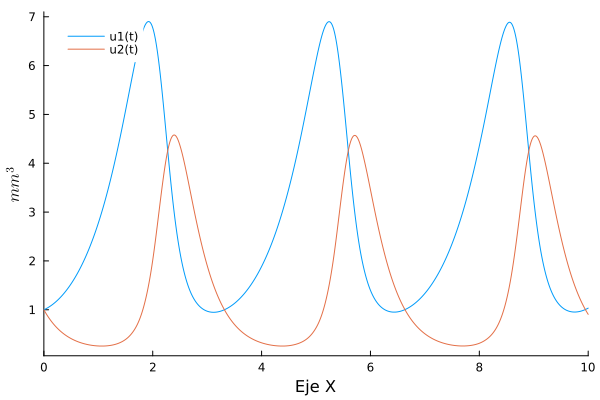

In [2]:
# Define Lotka-Volterra model.
function lotka_volterra(du, u, p, t)
    # Model parameters.
    α, β, γ, δ = p
    # Current state.
    x, y = u 
    
    # Evaluate differential equations.
    du[1] = (α - β * y) * x # prey
    du[2] = (δ * x - γ) * y # predator

    return nothing
end

# Define initial-value problem.
u0 = [1.0, 1.0]
p = [1.5, 1.0, 3.0, 1.0]
tspan = (0.0, 10.0)
prob = ODEProblem(lotka_volterra, u0, tspan, p)

# Plot simulation.
StatsPlots.plot(solve(prob, Tsit5()),grid=false,
foreground_color_legend = nothing,
xlabel = "Eje X",
ylabel = L"mm^3"
)
##color = [:darkgreen :darkblue :purple :darkred]
#xlims!(0, 42)

Generamos observaciones ruidosas para usar en las tareas de estimación bayesiana de parámetros. Con `saveat = 0.1` que especifica que la solución se almacena solo en `0.1` unidades de tiempo. Para hacer que el ejemplo sea más realista, agregamos ruido aleatorio normalmente dostribuido a la simulación. 

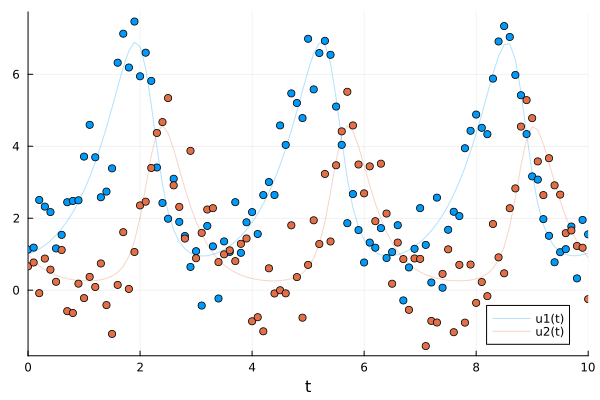

In [3]:
sol = solve(prob, Tsit5(); saveat=0.1)
odedata = Array(sol) + 0.8* randn(size(Array(sol)))

# Plot simulation and noisy observations.
StatsPlots.plot(sol; alpha=0.3)
scatter!(sol.t, odedata'; color=[1 2], label="")

Los paquetes $\textit{Turing}$ y $\textit{DifferentialEquations}$ son completamente compatibles, por lo que podemos escribir el problema de estimación de parámetros de Lotka - Volterra usando `@model`, de Turing, como se muestra a continuación: 

In [4]:
@model function fitlv(data, prob)
    # Prior distributions.
    σ ~ InverseGamma(2, 3)
    α ~ truncated(Normal(1.5, 0.5), 0.5, 2.5)
    β ~ truncated(Normal(1.2, 0.5), 0, 2)
    γ ~ truncated(Normal(3.0, 0.5), 1, 4)
    δ ~ truncated(Normal(1.0, 0.5), 0, 2)

    # Simulate Lotka-Volterra model. 
    p = [α, β, γ, δ]
    predicted = solve(prob, Tsit5(); p=p, saveat=0.1)

    # Observations.
    for i in 1:length(predicted)
        data[:, i] ~ MvNormal(predicted[i], σ^2 * I)
    end

    return nothing
end

fitlv (generic function with 2 methods)

In [5]:
model = fitlv(odedata, prob)

DynamicPPL.Model{typeof(fitlv), (:data, :prob), (), (), Tuple{Matrix{Float64}, ODEProblem{Vector{Float64}, Tuple{Float64, Float64}, true, Vector{Float64}, ODEFunction{true, SciMLBase.AutoSpecialize, typeof(lotka_volterra), UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED), Nothing, Nothing}, Base.Pairs{Symbol, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}, SciMLBase.StandardODEProblem}}, Tuple{}, DynamicPPL.DefaultContext}(fitlv, (data = [1.1288175938709484 1.1826275699222888 … 1.952516350852827 1.5512866505096623; 0.6621871061138195 0.7689388624749575 … 1.1795387293544284 -0.24951429608849474], prob = ODEProblem{Vector{Float64}, Tuple{Float64, Float64}, true, Vector{Float64}, ODEFunction{true, SciMLBase.AutoSpecialize, typeof(lotka_volterra), UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Noth

In [6]:
# Sample 3 independent chains with forward-mode automatic differentiation (the default).
chain = sample(model, NUTS(0.65), MCMCSerial(), 1000, 3; progress=false)

┌ Info: Found initial step size
└   ϵ = 0.05
┌ Info: Found initial step size
└   ϵ = 0.025
┌ Info: Found initial step size
└   ϵ = 0.05


Chains MCMC chain (1000×17×3 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 3
Samples per chain = 1000
Wall duration     = 63.4 seconds
Compute duration  = 61.77 seconds
parameters        = σ, α, β, γ, δ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse    ess_bulk    ess_tail      rhat   ⋯
      Symbol   Float64   Float64   Float64     Float64     Float64   Float64   ⋯

           σ    0.7781    0.0389    0.0009   2004.3982   1604.1013    1.0000   ⋯
           α    1.4703    0.0468    0.0017    718.9866    889.1466    1.0009   ⋯
           β    1.0015    0.0436    0.0015    866.8615   1285.9882    1.0009   ⋯
           γ    3.1178    0.1476    0.0053    764.9680    944.3792    1.0004   ⋯
           δ    1.0426    0.0543    0.0020    724.6553    91

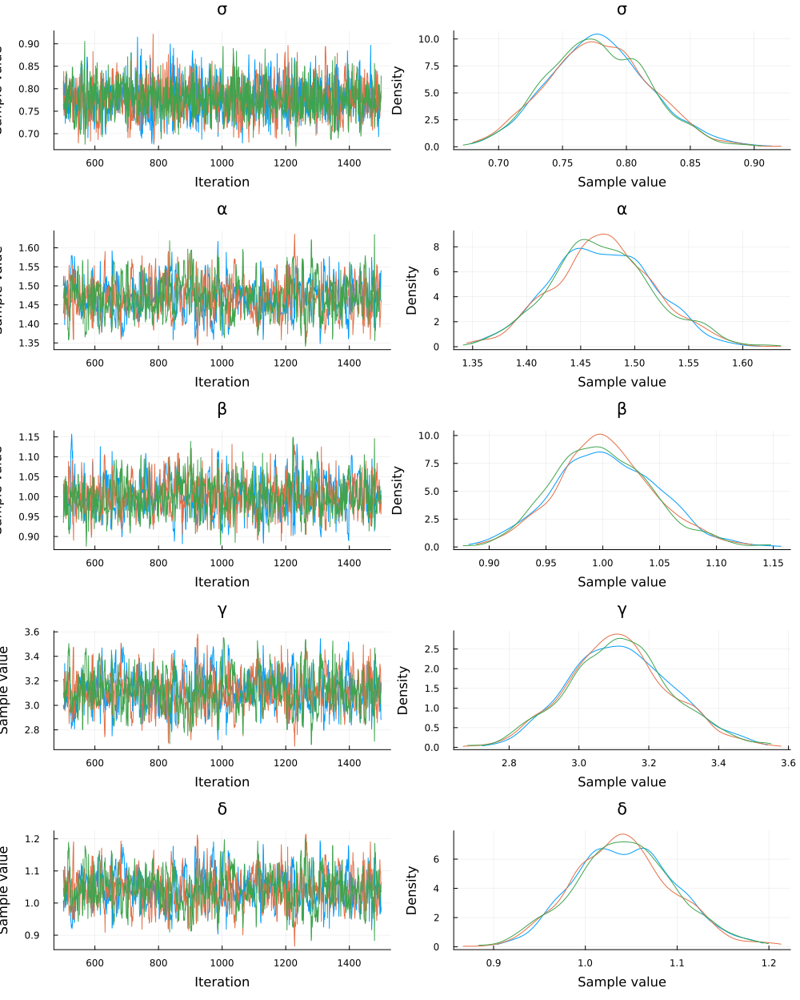

In [7]:
plot(chain)

In [8]:
using JLD2

In [11]:
using JLD2
archivo = "C:/Users/Pc/Documents/CODE/Estadistica Bayesiana/2. Sistemas EDO/Lotka-Volterra  con Bayesiana/ChainS.jld2"  # Especifica la ruta y el nombre del archivo
data = Dict("chain" => chain)  # Crear un diccionario para almacenar las cadenas
save(archivo, data)  # Guardar las cadenas en el archivo

In [14]:
# Cargar las cadenas desde el archivo
data = load(archivo)
chainguardadas = data["chain"]

Chains MCMC chain (1000×17×3 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 3
Samples per chain = 1000
Wall duration     = 63.4 seconds
Compute duration  = 61.77 seconds
parameters        = σ, α, β, γ, δ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse    ess_bulk    ess_tail      rhat   ⋯
      Symbol   Float64   Float64   Float64     Float64     Float64   Float64   ⋯

           σ    0.7781    0.0389    0.0009   2004.3982   1604.1013    1.0000   ⋯
           α    1.4703    0.0468    0.0017    718.9866    889.1466    1.0009   ⋯
           β    1.0015    0.0436    0.0015    866.8615   1285.9882    1.0009   ⋯
           γ    3.1178    0.1476    0.0053    764.9680    944.3792    1.0004   ⋯
           δ    1.0426    0.0543    0.0020    724.6553    91

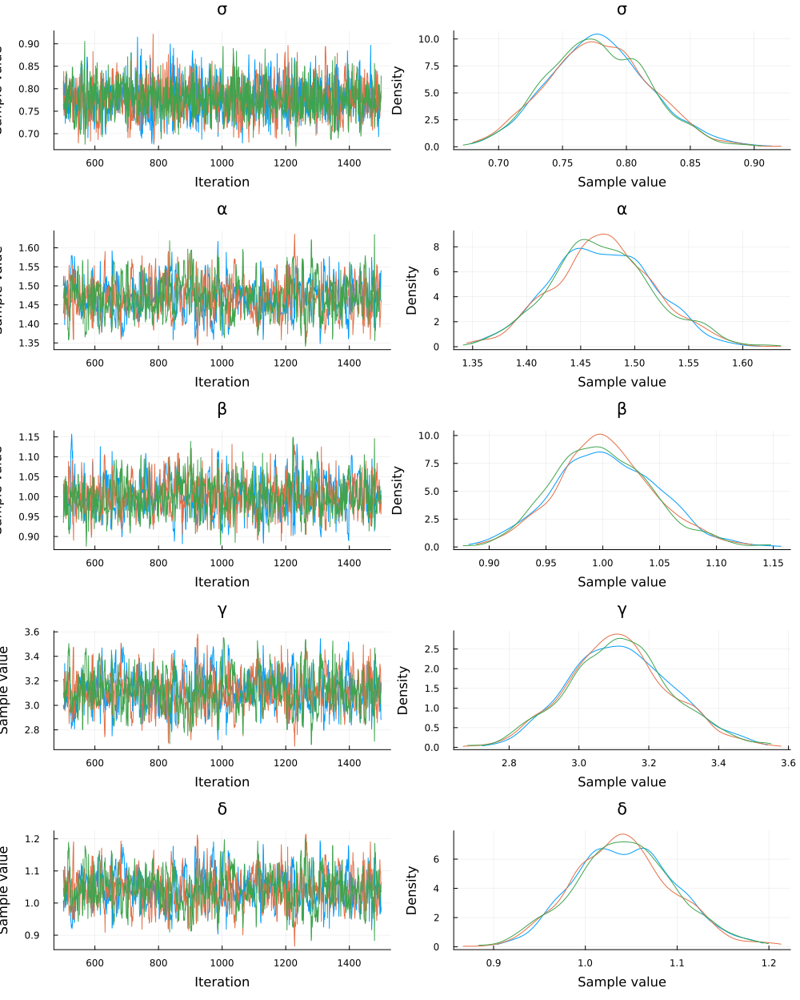

In [15]:
plot(chainguardadas)

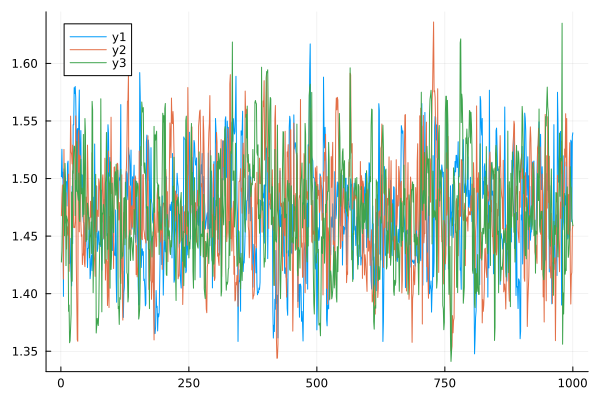

In [26]:
plot(chain[:α])

In [39]:
mean(chain[:α])

1.470274704560692

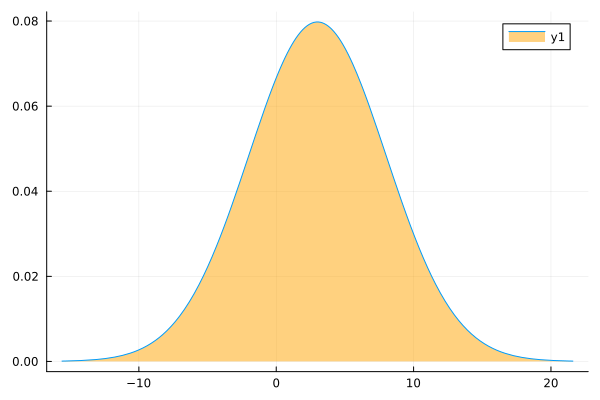

In [40]:
using Distributions
plot(Normal(3,5), fill=(0, .5,:orange))

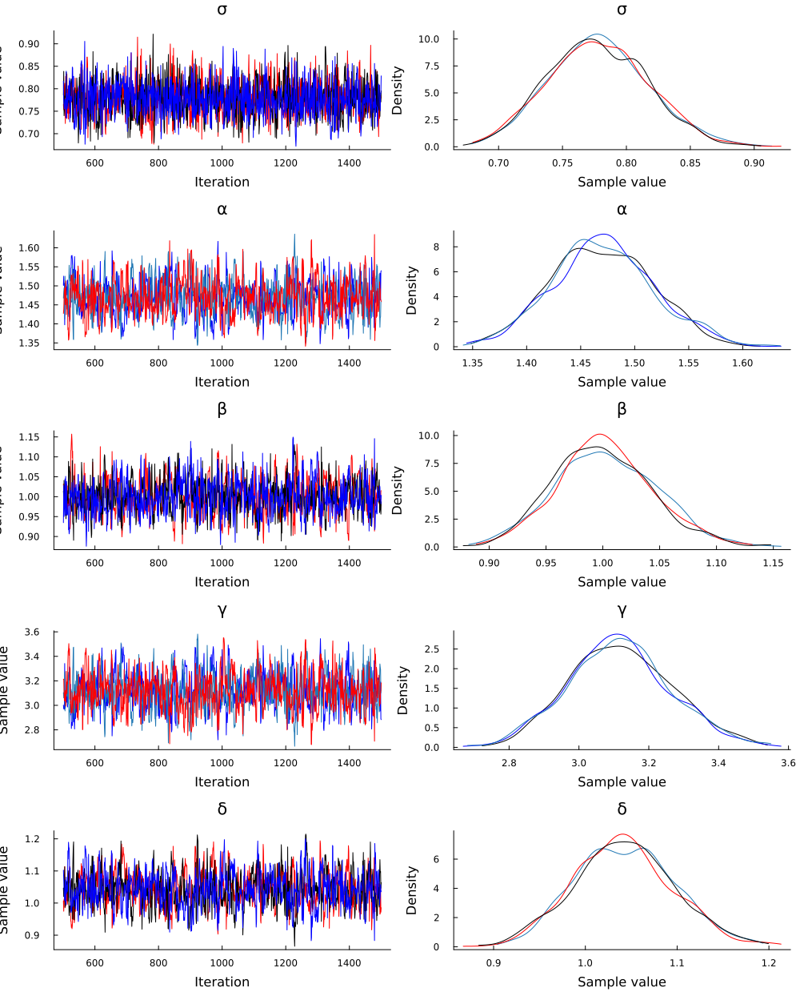

In [18]:
#plot(chain)
plot(chain,foreground_color_legend = nothing,grid=false,color = [:red :black :blue palette(:tab10)])

In [19]:
savefig("Cadenas.pdf") 

"c:\\Users\\Pc\\Documents\\CODE\\Estadistica Bayesiana\\2. Sistemas EDO\\Lotka-Volterra  con Bayesiana\\Cadenas.pdf"

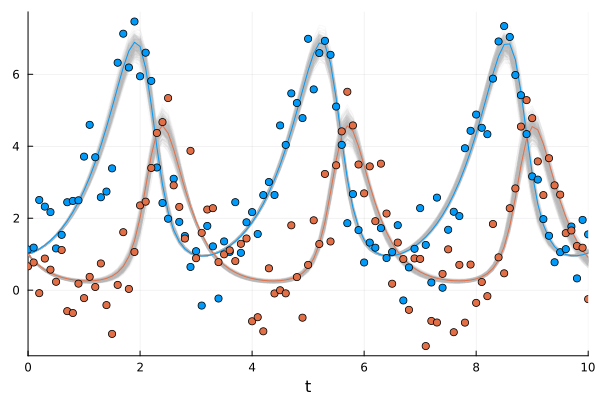

In [20]:
plot(; legend=false)
posterior_samples = sample(chain[[:α, :β, :γ, :δ]], 300; replace=false)
for p in eachrow(Array(posterior_samples))
    sol_p = solve(prob, Tsit5(); p=p, saveat=0.1)
    plot!(sol_p; alpha=0.1, color="#BBBBBB")
end

# Plot simulation and noisy observations.
plot!(sol; color=[1 2], linewidth=1)
scatter!(sol.t, odedata'; color=[1 2])

Los parámetros estimados están cerca de los valores de los parámetros con los que se generaron las observaciones. También podemos comprobar visualmente que las cadenas han convergido.

In [21]:
log_likelihood = let
           log_likelihood = pointwise_loglikelihoods(
               model, MCMCChains.get_sections(chain, :parameters)
           )
           names = sort(collect(keys(log_likelihood)); by=x->parse(Int, split(x, ",")[2][1:end-1]))
           log_likelihood_data = getindex.(Ref(log_likelihood), names)
           (; data=cat(log_likelihood_data...; dims=3))
       end;
idata_chainm1 = from_mcmcchains(chain; log_likelihood)
loo(idata_chainm1; pointwise=false)

Row,elpd_loo,se,p_loo,n_samples,n_data_points,warning,scale
,Float64,Float64,Float64,Int64,Int64,Bool,String
1,-236.833,8.81207,3.93418,3000,101,false,log


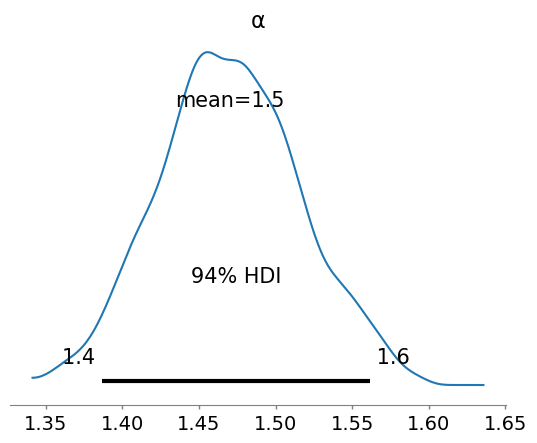

Normal{Float64}(μ=1.4702747045606914, σ=0.046795236490154525)

In [22]:
plot_posterior(idata_chainm1.posterior.α);
fit(Normal,idata_chainm1.posterior.α)

## Modelo de Lotka-Volterra sin datos de presa

In [24]:
@model function fitlv2(data::AbstractVector, prob)
    # Prior distributions.
    σ ~ InverseGamma(2, 3)
    α ~ truncated(Normal(1.5, 0.5), 0.5, 2.5)
    β ~ truncated(Normal(1.2, 0.5), 0, 2)
    γ ~ truncated(Normal(3.0, 0.5), 1, 4)
    δ ~ truncated(Normal(1.0, 0.5), 0, 2)

    # Simulate Lotka-Volterra model but save only the second state of the system (predators).
    p = [α, β, γ, δ]
    predicted = solve(prob, Tsit5(); p=p, saveat=0.1, save_idxs=2)

    # Observations of the predators.
    data ~ MvNormal(predicted.u, σ^2 * I)

    return nothing
end

model2 = fitlv2(odedata[2, :], prob)

# Sample 3 independent chains.
chain2 = sample(model2, NUTS(0.45), MCMCSerial(), 5000, 3; progress=false)

┌ Info: Found initial step size
└   ϵ = 0.2
┌ Info: Found initial step size
└   ϵ = 0.05
┌ Info: Found initial step size
└   ϵ = 0.05


Chains MCMC chain (5000×17×3 Array{Float64, 3}):

Iterations        = 1001:1:6000
Number of chains  = 3
Samples per chain = 5000
Wall duration     = 49.48 seconds
Compute duration  = 49.17 seconds
parameters        = σ, α, β, γ, δ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse   ess_bulk   ess_tail      rhat   e ⋯
      Symbol   Float64   Float64   Float64    Float64    Float64   Float64     ⋯

           σ    0.8103    0.0663    0.0070    88.7774    83.7102    1.0437     ⋯
           α    1.6704    0.1980    0.0173   129.0873   415.0022    1.0754     ⋯
           β    1.1609    0.1518    0.0125   145.6705   505.7178    1.0575     ⋯
           γ    2.9070    0.2905    0.0261   123.2425   375.1695    1.0859     ⋯
           δ    0.8077    0.2285    0.0194   136.1245   41

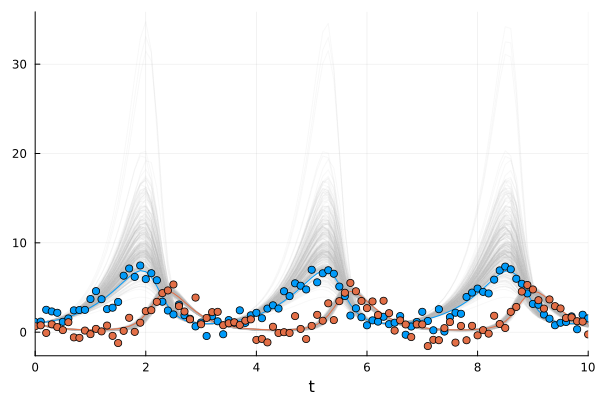

In [25]:
plot(; legend=false)
posterior_samples = sample(chain2[[:α, :β, :γ, :δ]], 300; replace=false)
for p in eachrow(Array(posterior_samples))
    sol_p = solve(prob, Tsit5(); p=p, saveat=0.1)
    plot!(sol_p; alpha=0.1, color="#BBBBBB")
end

# Plot simulation and noisy observations.
plot!(sol; color=[1 2], linewidth=1)
scatter!(sol.t, odedata'; color=[1 2])

¡Tenga en cuenta que aquí las observaciones de la presa (puntos azules) no se utilizaron en la estimación de parámetros! Sin embargo, el modelo puede predecir los valores de $x$ con relativa precisión, aunque con una distribución más amplia de soluciones, lo que refleja la mayor incertidumbre en la predicción de la $x$ valores.

In [15]:
log_likelihood = let
           log_likelihood = pointwise_loglikelihoods(
               model2, MCMCChains.get_sections(chain2, :parameters)
           )
           names = sort(collect(keys(log_likelihood)); by=x->parse(Int, split(x, ",")[2][1:end-1]))
           log_likelihood_data = getindex.(Ref(log_likelihood), names)
           (; data=cat(log_likelihood_data...; dims=3))
       end;
idata_chainm2 = from_mcmcchains(chain2; log_likelihood)
loo(idata_chainm2; pointwise=false)

C:\Users\Pc\.julia\conda\3\x86_64\lib\site-packages\arviz\stats\stats.py:1037: RuntimeWarning: overflow encountered in exp
  weights = 1 / np.exp(len_scale - len_scale[:, None]).sum(axis=1)
C:\Users\Pc\.julia\conda\3\x86_64\lib\site-packages\arviz\stats\stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Row,elpd_loo,se,p_loo,n_samples,n_data_points,warning,scale
,Float64,Float64,Float64,Int64,Int64,Bool,String
1,-124.648,0.0,3.95862,15000,1,true,log


## comparación de modelos

In [16]:
#modelos= Dict("Con datos de presas" => idata_chainm1 , "Sin datos de presas" => idata_chainm2 )
#compare(modelos) 
#plot_compare(compare(modelos), figsize=(5,3));